In [ ]:
# Catalyst
!pip install catalyst==20.12

# for augmentations
!pip install albumentations==0.4.3

# for pretrained segmentation models for PyTorch
!pip install segmentation-models-pytorch==0.1.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 490 kB 14.3 MB/s 
     |████████████████████████████████| 125 kB 70.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 10.6 MB/s 
     |████████████████████████████████| 631 kB 11.7 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.3-py3-none-any.whl size=60779 sha256=e078263a0d46ec7638330e214993ba9aa208089a62c076241cbef51a07a03932
  Stored in directory: /root/.cache/pip/wheels/9d/f4/ab/b45b873b6399eeb93386bee4f8bddb9ad0e2f54d34cde20861
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654019 sha256=60c27e8edfda872e6eef4af40e5847f66c8fd69897ed98b9c0e7aea94ffb79b8
  Stored in directory: /root/.cache/pip/wheels/89/72/98/3ebfdba1069a9a8eaaa7ae7265cfd67d63ef0197aaee2e5f9c
Successfully built albumentations imgau

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import os.path as osp
from tqdm import tqdm
import glob
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


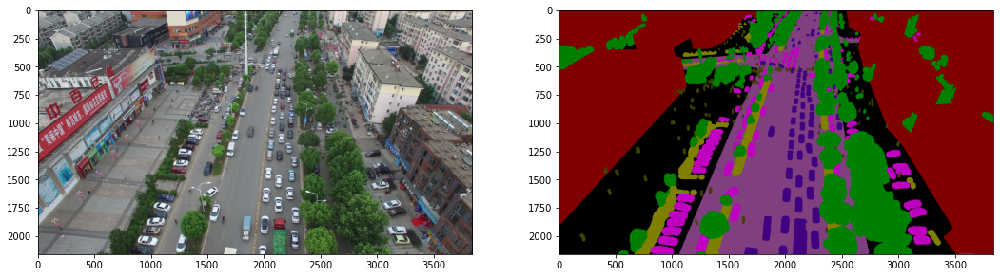

In [ ]:
# def example(image_path = '../input/uavid-semantic-segmentation-dataset/train/train/seq33/Images/000200.png',
            #  mask_path ='../input/uavid-semantic-segmentation-dataset/train/train/seq33/Labels/000200.png'):
def example(image_path = '/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train/seq1/Images/000200.png',
             mask_path ='/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train/seq1/Labels/000200.png'):
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    plt.figure(figsize=(18, 24))
    plt.subplot(1, 2, 1)
    plt.imshow(image)

    plt.subplot(1, 2, 2)
    plt.imshow(mask)
example()

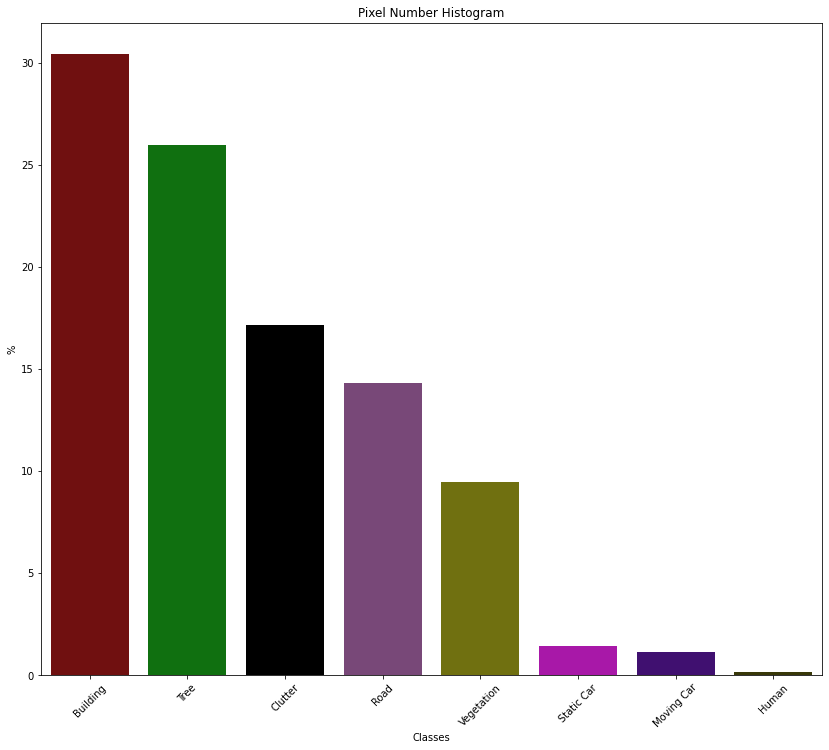

In [ ]:
import pandas as pd
import seaborn as sns

cls = ['Building', 'Tree', 'Clutter', 'Road', 'Vegetation', 'Static Car', 'Moving Car', 'Human']
pixels = [30.436, 25.977, 17.120, 14.322, 9.464, 1.405, 1.115, 0.162]
pix = pd.DataFrame({'Classes': cls, 'Pixel Number': pixels})

def plot_pixel():
    plt.figure(figsize=(14,12))
    sns.set_palette(['#800000','#008000','#000000', '#804080', '#808000', '#C000C0', '#400080', '#404000'])
    sns.barplot(x='Classes', y='Pixel Number', data=pix)
    plt.title('Pixel Number Histogram')
    plt.ylabel('%')
    plt.xticks(rotation=45)

plot_pixel()

In [ ]:
class UAVidColorTransformer:
    def __init__(self):
    # color table.
        self.clr_tab = self.createColorTable()
    # id table.
        id_tab = {}
        for k, v in self.clr_tab.items():
            id_tab[k] = self.clr2id(v)
        self.id_tab = id_tab

    def createColorTable(self):
        clr_tab = {}
        clr_tab['Clutter'] = [0, 0, 0]
        clr_tab['Building'] = [128, 0, 0]
        clr_tab['Road'] = [128, 64, 128]
        clr_tab['Static_Car'] = [192, 0, 192]
        clr_tab['Tree'] = [0, 128, 0]
        clr_tab['Vegetation'] = [128, 128, 0]
        clr_tab['Human'] = [64, 64, 0]
        clr_tab['Moving_Car'] = [64, 0, 128]
        return clr_tab

    def colorTable(self):
        return self.clr_tab

    def clr2id(self, clr):
        return clr[0]+clr[1]*255+clr[2]*255*255

  #transform to uint8 integer label
    def transform(self,label, dtype=np.int32):
        height,width = label.shape[:2]
    # default value is index of clutter.
        newLabel = np.zeros((height, width), dtype=dtype)
        id_label = label.astype(np.int64)
        id_label = id_label[:,:,0]+id_label[:,:,1]*255+id_label[:,:,2]*255*255
        for tid,val in enumerate(self.id_tab.values()):
            mask = (id_label == val)
            newLabel[mask] = tid
        return newLabel

  #transform back to 3 channels uint8 label
    def inverse_transform(self, label):
        label_img = np.zeros(shape=(label.shape[0], label.shape[1],3),dtype=np.uint8)
        values = list(self.clr_tab.values())
        for tid,val in enumerate(values):
            mask = (label==tid)
            label_img[mask] = val
        return label_img

In [ ]:
clrEnc = UAVidColorTransformer()
def prepareTrainIDForDir(gtDirPath, saveDirPath):
    gt_paths = [p for p in os.listdir(gtDirPath) if p.startswith('seq')]
    for pd in tqdm(gt_paths):
        lbl_dir = osp.join(gtDirPath, pd, 'Labels')
        lbl_paths = os.listdir(lbl_dir)
        if not osp.isdir(osp.join(saveDirPath, pd, 'TrainId')):
            os.makedirs(osp.join(saveDirPath, pd, 'TrainId'))
            assert osp.isdir(osp.join(saveDirPath, pd, 'TrainId')), 'Fail to create directory:%s'%(osp.join(saveDirPath, pd, 'TrainId'))
        for lbl_p in lbl_paths:
            lbl_path = osp.abspath(osp.join(lbl_dir, lbl_p))
            trainId_path = osp.join(saveDirPath, pd, 'TrainId', lbl_p)
            gt = np.array(Image.open(lbl_path))
            trainId = clrEnc.transform(gt, dtype=np.uint8)
            Image.fromarray(trainId).save(trainId_path)

In [ ]:
# prepareTrainIDForDir('../input/uavid-semantic-segmentation-dataset/train/train', './trainlabels/')
# prepareTrainIDForDir('../input/uavid-semantic-segmentation-dataset/valid/valid', './validlabels/')

# prepareTrainIDForDir('/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train', '/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/labels/trainlabels')
# prepareTrainIDForDir('/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train', '/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/labels/validlabels')

In [ ]:
# train_image_list = sorted(glob.glob(pathname='../input/uavid-semantic-segmentation-dataset/train/train/*/Images/*.png', recursive=True))
# train_mask_list =  sorted(glob.glob(pathname='./trainlabels/*/TrainId/*.png', recursive=True))
# valid_image_list = sorted(glob.glob(pathname='../input/uavid-semantic-segmentation-dataset/valid/valid/*/Images/*.png', recursive=True))
# valid_mask_list =  sorted(glob.glob(pathname='./validlabels/*/TrainId/*.png', recursive=True))
# print(train_image_list[42])
# print(train_mask_list[42])

train_image_list = sorted(glob.glob(pathname='/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train/*/Images/*.png', recursive=True))
train_mask_list =  sorted(glob.glob(pathname='/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/labels/trainlabels/*/TrainId/*.png', recursive=True))
valid_image_list = sorted(glob.glob(pathname='/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/valid/valid/*/Images/*.png', recursive=True))
valid_mask_list =  sorted(glob.glob(pathname='/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/labels/validlabels/*/TrainId/*.png', recursive=True))


print(train_image_list[42])
print(train_mask_list[42])

/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/data/train/train/seq1/Images/file11-2.png
/content/drive/MyDrive/Bennett/Bennett_Datasets/uavid/labels/trainlabels/seq1/TrainId/file11-2.png


In [ ]:
# Catalyst

# SEED = 42
# utils.set_global_seed(SEED)
# utils.prepare_cudnn(deterministic=True)
# is_fp16_used = True

In [ ]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

class Dataset(BaseDataset):

    CLASSES = ['clutter', 'building', 'road', 'static_car', 'tree', 'vegetation', 'human', 'moving_car']

    def __init__(
            self,
            images_list,
            masks_list,
            classes=None,
            augmentation=None,
            preprocessing=None,
    ):
        self.images_list = images_list
        self.masks_list = masks_list
        self.classes = classes

        # convert str names to class values on masks
        if self.classes is not None:
            self.class_values = np.array([self.CLASSES.index(cls.lower()) for cls in classes]) / 255

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        # read data
        image = cv2.imread(self.images_list[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_list[i], 0)
        mask = mask.astype('float') / 255

        # extract certain classes from mask (e.g. cars)
        if self.classes is not None:
            masks = [(mask == v) for v in self.class_values]
            mask = np.stack(masks, axis=-1).astype('float')
        else:
            mask = np.expand_dims(mask, 2)
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']


        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.images_list)

In [ ]:
def visualize(image, mask, label=None, truth=None,  augment=False):
    if truth is None:
        plt.figure(figsize=(14, 20))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        if augment == False:
            plt.title(f"{'Original Image'}")
        else:
            plt.title(f"{'Augmented Image'}")

        plt.subplot(1, 2, 2)
        plt.imshow(mask)
        if label is not None:
            plt.title(f"{label.capitalize()}")

    else:
        plt.figure(figsize=(26, 36))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title(f"{'Original Image'}")

        plt.subplot(1, 3, 2)
        plt.imshow(mask)
        plt.title(f"{'Prediction'}")

        plt.subplot(1, 3, 3)
        plt.imshow(truth)
        plt.title(f"{'Ground Truth'}")

def visualize_overlay(image, mask, truth_path=None):
    if truth_path is None:
        plt.figure(figsize=(26, 36))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"{'Original Image'}")

        plt.subplot(1, 2, 2)
        plt.imshow(mask)
        plt.title(f"{'Prediction'}")

    else:
        truth = Image.open(truth_path)
        plt.figure(figsize=(26, 36))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title(f"{'Original Image'}")

        plt.subplot(1, 3, 2)
        plt.imshow(mask)
        plt.title(f"{'Prediction'}")

        plt.subplot(1, 3, 3)
        plt.imshow(truth)
        plt.title(f"{'Ground Truth'}")

def visualize_prediction(image, mask):
        plt.figure(figsize=(26, 36))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"{'Original Image'}")

        plt.subplot(1, 2, 2)
        plt.imshow(mask)
        plt.title(f"{'Prediction'}")

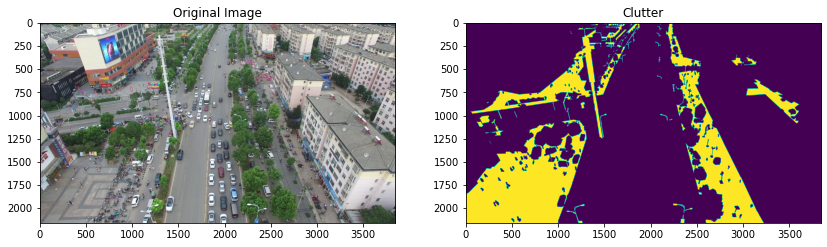

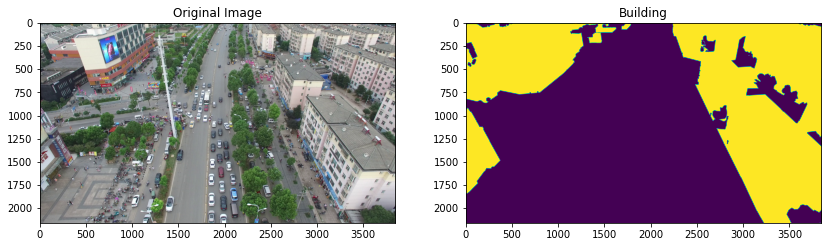

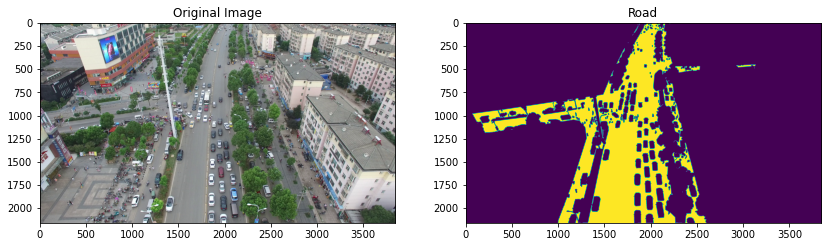

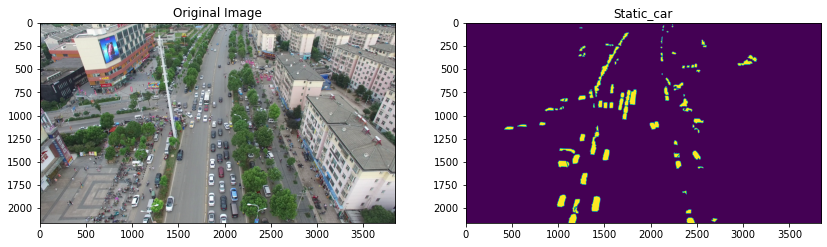

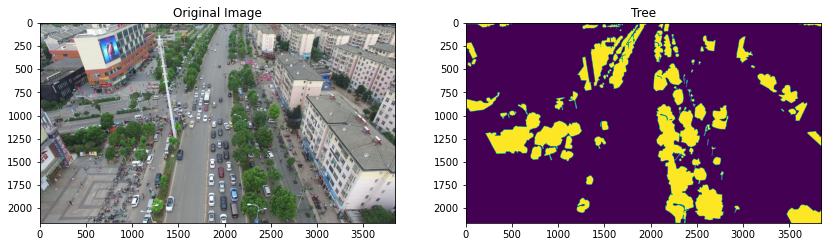

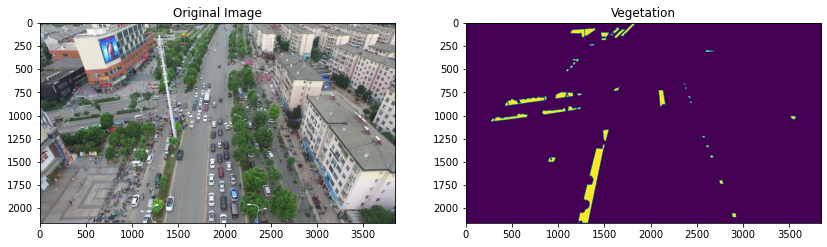

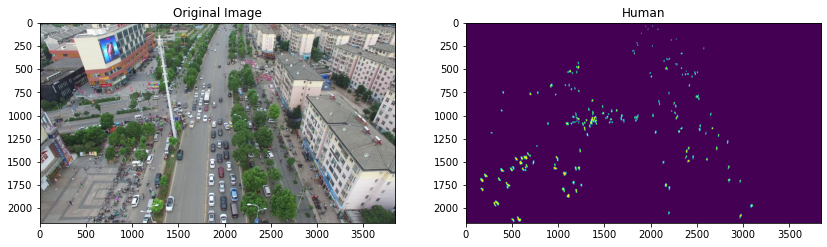

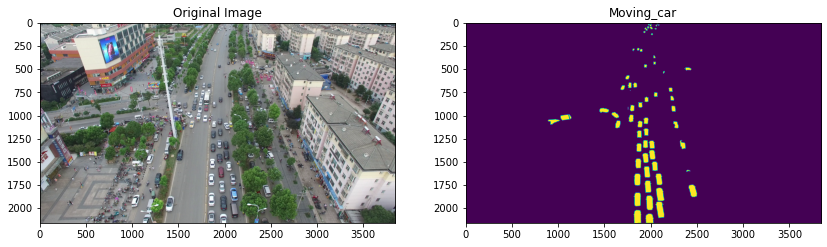

In [ ]:
labels = ['clutter', 'building', 'road', 'static_car', 'tree', 'vegetation', 'human', 'moving_car']
for label in labels:
    dataset = Dataset(train_image_list, train_mask_list, classes=[label])

    image, mask = dataset[4]
    visualize(
        image=image, mask=mask.squeeze(),
        label = label)

In [ ]:
import albumentations as albu

def get_training_augmentation():
    train_transform = [

        albu.Resize(576, 1024, p=1),
        albu.HorizontalFlip(p=0.5),

        albu.OneOf([
            albu.RandomBrightnessContrast(
                  brightness_limit=0.4, contrast_limit=0.4, p=1),
            albu.CLAHE(p=1),
            albu.HueSaturationValue(p=1)
            ],
            p=0.9,
        ),

        albu.IAAAdditiveGaussianNoise(p=0.2),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    test_transform = [albu.Resize(576, 1024, p=1),
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

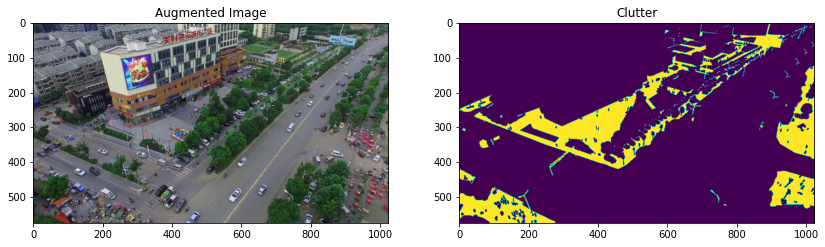

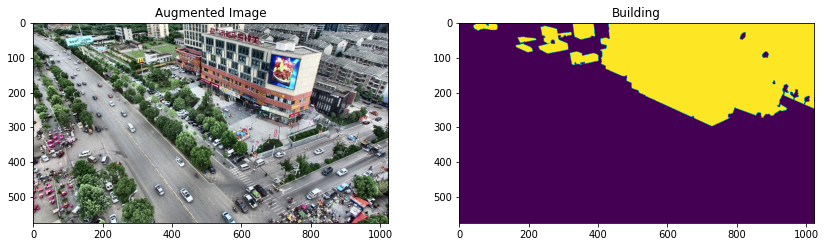

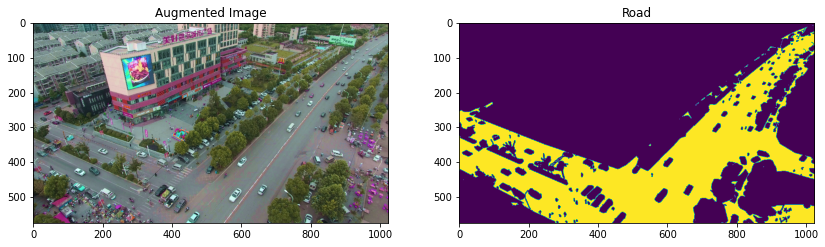

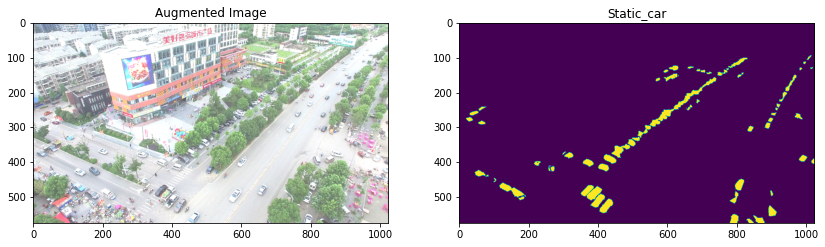

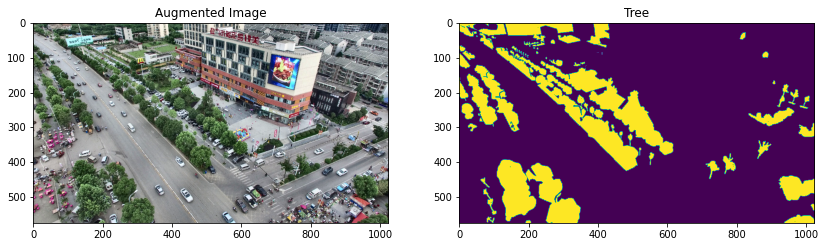

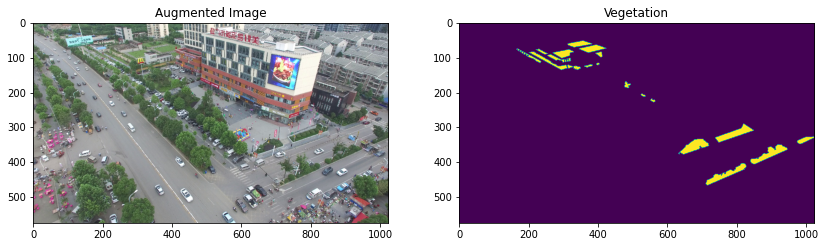

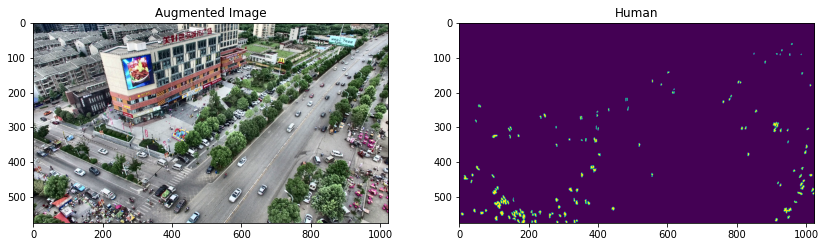

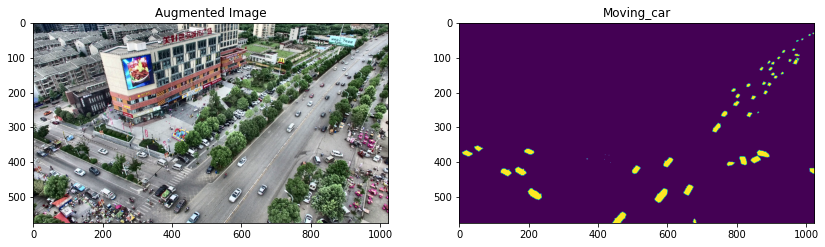

In [ ]:
labels = ['clutter', 'building', 'road', 'static_car', 'tree', 'vegetation', 'human', 'moving_car']
for label in labels:
    augmented_dataset = Dataset(
        train_image_list,
        train_mask_list,
        augmentation=get_training_augmentation(),
        classes=[label],
    )

# same image with different random transforms
    image, mask = augmented_dataset[8]
    visualize(
        image=image, mask=mask.squeeze(),
        label = label, augment=True)

In [ ]:
import segmentation_models_pytorch as smp

ENCODER = 'efficientnet-b3'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'
CLASSES = ['clutter', 'building', 'road', 'static_car', 'tree', 'vegetation', 'human', 'moving_car']

# create segmentation model with pretrained encoder
model = smp.FPN(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=len(CLASSES),
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b3-5fb5a3c3.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b3-5fb5a3c3.pth


  0%|          | 0.00/47.1M [00:00<?, ?B/s]

In [ ]:
# batch_size = 6
batch_size = 1

train_dataset = Dataset(
    train_image_list,
    train_mask_list,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

valid_dataset = Dataset(
    valid_image_list,
    valid_mask_list,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)

loaders = {
    "train": train_loader,
    "valid": valid_loader
}

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:2908: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  "Using lambda is incompatible with multiprocessing. "


In [ ]:
# Catalyst

# if is_fp16_used:
#     fp16_params = dict(opt_level="O1")
# else:
#     fp16_params = None

# print(f"FP16 params: {fp16_params}")

In [ ]:
# Catalyst

# from catalyst.contrib.nn import BCEDiceLoss, RAdam, Lookahead, OneCycleLRWithWarmup
# from catalyst.dl import SupervisedRunner

# logdir = "./logs"
# num_epochs = 30
# # num_epochs = 2
# learning_rate = 1e-3
# base_optimizer = RAdam([
#     {'params': model.decoder.parameters(), 'lr': learning_rate},
#     {'params': model.encoder.parameters(), 'lr': 1e-4},
#     {'params': model.segmentation_head.parameters(), 'lr': learning_rate},
# ])
# optimizer = Lookahead(base_optimizer)
# criterion = BCEDiceLoss(activation=None)
# runner = SupervisedRunner()
# scheduler = OneCycleLRWithWarmup(
#     optimizer,
#     num_steps=num_epochs,
#     lr_range=(0.0016, 0.0000001),
#     init_lr = learning_rate,
#     warmup_steps=2
# )

In [ ]:
# Catalyst

# from catalyst.dl.callbacks import IouCallback, WandbLogger, EarlyStoppingCallback, ClasswiseIouCallback

# callbacks = [
#     IouCallback(activation = 'none'),
#     ClasswiseIouCallback(classes=CLASSES, activation = 'none'),
#     EarlyStoppingCallback(patience=7, metric='iou', minimize=False),
#     WandbLogger(project='Project_Name', name='Run_Name'),

# ]

In [ ]:
# Catalyst

# runner.train(
#     model=model,
#     criterion=criterion,
#     optimizer=optimizer,
#     scheduler=scheduler,
#     loaders=loaders,
#     callbacks=callbacks,
#     logdir=logdir,
#     num_epochs=num_epochs,
#     # save our best checkpoint by IoU metric
#     main_metric="iou",
#     # IoU needs to be maximized.
#     minimize_metric=False,
#     # for FP16. It uses the variable from the very first cell
#     fp16=fp16_params,
#     # prints train logs
#     verbose=True,
# )

In [ ]:
from torch import nn

from catalyst.contrib.nn import DiceLoss, IoULoss

# we have multiple criterions
criterion = {
    "dice": DiceLoss(),
    "iou": IoULoss(),
    "bce": nn.BCEWithLogitsLoss()
}

In [ ]:
from torch import optim

from catalyst import utils
from catalyst.contrib.nn import RAdam, Lookahead

learning_rate = 0.001
encoder_learning_rate = 0.0005

# Since we use a pre-trained encoder, we will reduce the learning rate on it.
layerwise_params = {"encoder*": dict(lr=encoder_learning_rate, weight_decay=0.00003)}

# This function removes weight_decay for biases and applies our layerwise_params
model_params = utils.process_model_params(model, layerwise_params=layerwise_params)

# Catalyst has new SOTA optimizers out of box
base_optimizer = RAdam(model_params, lr=learning_rate, weight_decay=0.0003)
optimizer = Lookahead(base_optimizer)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.25, patience=2)

In [ ]:
# this variable will be used in `runner.train` and by default we disable FP16 mode
is_fp16_used = False

In [ ]:
from catalyst.dl import SupervisedRunner

num_epochs = 3
logdir = "./logs/segmentation"

device = utils.get_device()
print(f"device: {device}")

if is_fp16_used:
    fp16_params = dict(opt_level="O1") # params for FP16
else:
    fp16_params = None

print(f"FP16 params: {fp16_params}")


# by default SupervisedRunner uses "features" and "targets",
# in our case we get "image" and "mask" keys in dataset __getitem__
runner = SupervisedRunner(device=device, input_key="image", input_target_key="mask")

device: cuda
FP16 params: None


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {logdir}

<IPython.core.display.Javascript object>

In [ ]:
from catalyst.dl import DiceCallback, IouCallback, \
  CriterionCallback, MetricAggregationCallback
from catalyst.contrib.callbacks import DrawMasksCallback

callbacks = [
    # Each criterion is calculated separately.
    CriterionCallback(
        input_key="mask",
        prefix="loss_dice",
        criterion_key="dice"
    ),
    CriterionCallback(
        input_key="mask",
        prefix="loss_iou",
        criterion_key="iou"
    ),
    CriterionCallback(
        input_key="mask",
        prefix="loss_bce",
        criterion_key="bce"
    ),

    # And only then we aggregate everything into one loss.
    MetricAggregationCallback(
        prefix="loss",
        mode="weighted_sum", # can be "sum", "weighted_sum" or "mean"
        # because we want weighted sum, we need to add scale for each loss
        metrics={"loss_dice": 1.0, "loss_iou": 1.0, "loss_bce": 0.8},
    ),

    # metrics
    DiceCallback(input_key="mask"),
    IouCallback(input_key="mask"),
    # visualization
    DrawMasksCallback(output_key='logits',
                      input_image_key='image',
                      input_mask_key='mask',
                      summary_step=50
    )
]

runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    # our dataloaders
    loaders=loaders,
    # We can specify the callbacks list for the experiment;
    callbacks=callbacks,
    # path to save logs
    logdir=logdir,
    num_epochs=num_epochs,
    # save our best checkpoint by IoU metric
    main_metric="iou",
    # IoU needs to be maximized.
    minimize_metric=False,
    # for FP16. It uses the variable from the very first cell
    fp16=fp16_params,
    # prints train logs
    verbose=True,
)

1/3 * Epoch (train):   0% 0/600 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/catalyst/contrib/nn/optimizers/radam.py:85: UserWarning:

This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:1174.)



1/3 * Epoch (train):   1% 4/600 [00:14<20:58,  2.11s/it, dice=0.170, iou=0.106, loss=2.399, loss_bce=0.842, loss_dice=0.830, loss_iou=0.894]